# in-place版のFFTを用いた偏微分方程式の数値解法

黒木玄

2018-01-23～2018-09-08

* Copyrigtht 2018 Gen Kuroki
* License: MIT https://opensource.org/licenses/MIT

$
\newcommand\Z{{\mathbb Z}}
\newcommand\R{{\mathbb R}}
\newcommand\C{{\mathbb C}}
\newcommand\eps{\varepsilon}
\newcommand\QED{\text{□}}
\newcommand\d{\partial}
$

このノートブックは最初以下の2つのノートブックの続きとして作成された.

* [FFTを用いた熱方程式やKdV方程式などを数値解法](http://nbviewer.jupyter.org/gist/genkuroki/14b05a2cfa172fc5ea351641d4bdda11)
* [2次元配列でのFFTの使い方](http://nbviewer.jupyter.org/gist/genkuroki/26928d4a1ae2e912a3850ed1b31e2941)

このノートブックでは in-place でFFTを使うことによってメモリ効率を最適化することを行いたい. 例として熱方程式, KdV方程式, Schroedinger方程式, Smith方程式を扱う.

<h1>目次<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#諸定義" data-toc-modified-id="諸定義-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>諸定義</a></span><ul class="toc-item"><li><span><a href="#パッケージの読み込み" data-toc-modified-id="パッケージの読み込み-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>パッケージの読み込み</a></span></li><li><span><a href="#数式を使った解説" data-toc-modified-id="数式を使った解説-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>数式を使った解説</a></span></li><li><span><a href="#FFT_Data-タイプの定義" data-toc-modified-id="FFT_Data-タイプの定義-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>FFT_Data タイプの定義</a></span></li><li><span><a href="#プロット用の函数" data-toc-modified-id="プロット用の函数-1.4"><span class="toc-item-num">1.4&nbsp;&nbsp;</span>プロット用の函数</a></span></li></ul></li><li><span><a href="#熱方程式で以上の定義のテスト" data-toc-modified-id="熱方程式で以上の定義のテスト-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>熱方程式で以上の定義のテスト</a></span></li><li><span><a href="#KdV方程式の数値解法の最適化" data-toc-modified-id="KdV方程式の数値解法の最適化-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>KdV方程式の数値解法の最適化</a></span><ul class="toc-item"><li><span><a href="#プロット用函数" data-toc-modified-id="プロット用函数-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>プロット用函数</a></span></li><li><span><a href="#FFTを-FFT-*-v,-FFT-\-v-の形式で利用した場合" data-toc-modified-id="FFTを-FFT-*-v,-FFT-\-v-の形式で利用した場合-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>FFTを <code>FFT * v</code>, <code>FFT \ v</code> の形式で利用した場合</a></span></li><li><span><a href="#FFTを-in-place-で利用した場合" data-toc-modified-id="FFTを-in-place-で利用した場合-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>FFTを in-place で利用した場合</a></span></li><li><span><a href="#KdV方程式:-初期条件-sin" data-toc-modified-id="KdV方程式:-初期条件-sin-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>KdV方程式: 初期条件 sin</a></span></li><li><span><a href="#ベンチマークテスト" data-toc-modified-id="ベンチマークテスト-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>ベンチマークテスト</a></span></li><li><span><a href="#KdV方程式:-2-soliton解" data-toc-modified-id="KdV方程式:-2-soliton解-3.6"><span class="toc-item-num">3.6&nbsp;&nbsp;</span>KdV方程式: 2-soliton解</a></span></li></ul></li><li><span><a href="#1次元のSchroedinger方程式" data-toc-modified-id="1次元のSchroedinger方程式-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>1次元のSchroedinger方程式</a></span><ul class="toc-item"><li><span><a href="#Gaussian-packet" data-toc-modified-id="Gaussian-packet-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Gaussian packet</a></span></li><li><span><a href="#自由粒子" data-toc-modified-id="自由粒子-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>自由粒子</a></span></li><li><span><a href="#低い壁" data-toc-modified-id="低い壁-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>低い壁</a></span></li><li><span><a href="#高い壁" data-toc-modified-id="高い壁-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>高い壁</a></span></li><li><span><a href="#調和振動子" data-toc-modified-id="調和振動子-4.5"><span class="toc-item-num">4.5&nbsp;&nbsp;</span>調和振動子</a></span></li><li><span><a href="#$V(x)-=--100-\exp(-x^2/100)$" data-toc-modified-id="$V(x)-=--100-\exp(-x^2/100)$-4.6"><span class="toc-item-num">4.6&nbsp;&nbsp;</span>$V(x) = -100 \exp(-x^2/100)$</a></span></li></ul></li><li><span><a href="#Smith方程式" data-toc-modified-id="Smith方程式-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Smith方程式</a></span><ul class="toc-item"><li><span><a href="#Smith方程式:-初期条件-sin" data-toc-modified-id="Smith方程式:-初期条件-sin-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Smith方程式: 初期条件 sin</a></span></li><li><span><a href="#Smith方程式:-初期条件-KdV-2-soliton" data-toc-modified-id="Smith方程式:-初期条件-KdV-2-soliton-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Smith方程式: 初期条件 KdV 2-soliton</a></span></li></ul></li></ul></div>

## 諸定義

### パッケージの読み込み

In [1]:
using Base64
using FFTW
using LinearAlgebra
const e = ℯ
linspace(start, stop, length) = range(start, stop=stop, length=length)

using PyPlot

default_figsize = (6.4, 4.8)  # このデフォルトサイズは大き過ぎるので
rc("figure", figsize=(3,2.4)) # このように小さくしておく.

using PyCall
const animation = pyimport("matplotlib.animation")

function displayfile(mimetype, file)
    open(file) do f
        base64text = base64encode(f)
        display("text/html", """<img src="data:$mimetype;base64,$base64text">""")
    end
end

displayfile (generic function with 1 method)

In [2]:
@show Sys.CPU_THREADS
FFTW.set_num_threads(Sys.CPU_THREADS)

Sys.CPU_THREADS = 8


### 数式を使った解説

周期 $L=2\pi K$ を持つ函数を

$$
f(x) = 
\sum_{k=-N/2+1}^{N/2} (-1)^{k-1} a_k\;e^{2\pi i(k-1)x/L} =
\sum_{k=-N/2+1}^{N/2} (-1)^{k-1} a_k\;e^{i(k-1)x/K}
$$

の形の有限Fourier級数でよく近似できていると仮定する. これの導函数は

$$
f'(x) = \sum_{k=-N/2+1}^{N/2} (-1)^{k-1} \frac{i(k-1)}{K}a_k\;e^{i(k-1)x/K}
$$

になる. すなわち, $f(x)$ を微分する操作は,  $-N/2< k \leqq N/2$ のとき $a_k$ に $i(k-1)/K$ をかける操作に対応している. $-N/2< k \leqq N/2$ のとき $a_k$ に $i(k-1)/K$ をかける操作は(丸め誤差)を除いて, 有限Fourier級数の正確な微分を与えることに注意せよ. この計算方法は小さな $h$ について $(f(x+h/2)-f(x-h/2))/h$ のような方法で微分を求める方法よりも誤差が小さい.

さらに $x$ を

$$
\Delta x = \frac{L}{N} = \frac{2\pi K}{N}, \quad
x_j = (j-1)\Delta x -\frac{L}{2} = L\left(\frac{j-1}{N} - \frac{1}{2}\right)
$$

で離散化したとする. このとき,

$$
f(x_j) = \sum_{k=-N/2-1}^{N/2} a_k\;e^{i(k-1)(j-1)/N}.
$$

これは $a_{k+N}=a_k$ という仮定のもとで

$$
f(x_j) = \sum_{k=1}^N a_k\; e^{i(k-1)(j-1)/N}
$$

と書き直される.  これはJulia言語の離散Fourier変換のスタイルに一致している. この表示のもとで, $f(x)$ を微分する操作は, $1\leqq k\leqq N/2$ のとき $i(k-1)/N$ を $a_k$ にかけ, $N/2+1\leqq k\leqq N$ のとき $i(k-1-N)/N$ を $a_k$ にかける操作に対応している.  `FFT_Data` における `D` を成分ごとにかける操作はまさにこの操作になっている.

In [3]:
?ifft

search: ifft ifft! ifftshift irfft plan_ifft plan_ifft! Cptrdiff_t plan_irfft



```
ifft(A [, dims])
```

Multidimensional inverse FFT.

A one-dimensional inverse FFT computes

$$
\operatorname{IDFT}(A)[k] = \frac{1}{\operatorname{length}(A)}
\sum_{n=1}^{\operatorname{length}(A)} \exp\left(+i\frac{2\pi (n-1)(k-1)}
{\operatorname{length}(A)} \right) A[n].
$$

A multidimensional inverse FFT simply performs this operation along each transformed dimension of `A`.


### FFT_Data タイプの定義

In [4]:
# right-open interval [a,b)
#
roi(a, b, N) = collect(linspace(a, b-(b-a)/N, N))

# x axis (Assume the priodic boundary condition with period L)
#
x_axis(L, N) = roi(-L/2, L/2, N)

# k axis (k = the wave number)
#
function k_axis(N)
    @assert iseven(N)
    Ndiv2 = div(N,2)
    vcat(roi(0,Ndiv2,Ndiv2), roi(-Ndiv2,0,Ndiv2))
end

# FFT Data
#
mutable struct FFT_Data{T<:Real, S}
    K::T
    L::T
    N::Int64
    x::Array{T,1}
    k::Array{T,1}
    D::Array{Complex{T},1}
    D2::Array{Complex{T},1}
    D3::Array{Complex{T},1}
    D4::Array{Complex{T},1}
    FFT::S
end

# FFT \ (D.^m .* (FFT * u)) = (d/dx)^m u
#
function FFT_Data(K, N)
    L = 2π*K
    x = x_axis(L, N)
    k = k_axis(N)
    D = im .* k ./ K
    FFT  = plan_fft(Array{Complex{Float64},1}(undef, N))
    FFT_Data(Float64(K), L, N, x, k, D, D.^2, D.^3, D.^4, FFT)
end

FFT_Data

### プロット用の函数

In [5]:
# nearly zero
#
function imagisnealyzero(z)
    maximum(abs, imag(z))/(maximum(abs, real(z)) + 1e-15) < 1e-3
end

# plot complex number array u on x
#
function plot_u(x, u)
    plot(x, real(u), label="Re", lw=0.8)
    imagisnealyzero(u) || plot(x, imag(u), label="Im", lw=0.8, ls="--")
    grid(ls=":")
    xticks(fontsize=8)
    yticks(fontsize=8)
end

plot_u (generic function with 1 method)

## 熱方程式で以上の定義のテスト

この節では次の熱方程式を $x$ 方向に関する周期境界条件のもとで数値的に解こう:

$$
u_t = u_{xx}.
$$

この方程式は形式的には次のように解ける: $u(t) : x\mapsto u(t,x)$ について, 

$$
u(t) = \exp\left(t \left(\frac{\d}{\d x}\right)^2\right)u(0).
$$

以下では $x$ 方向について離散化し, $(\d/\d x)^2$ を高速Fourier変換(FFT)を使って実現する.

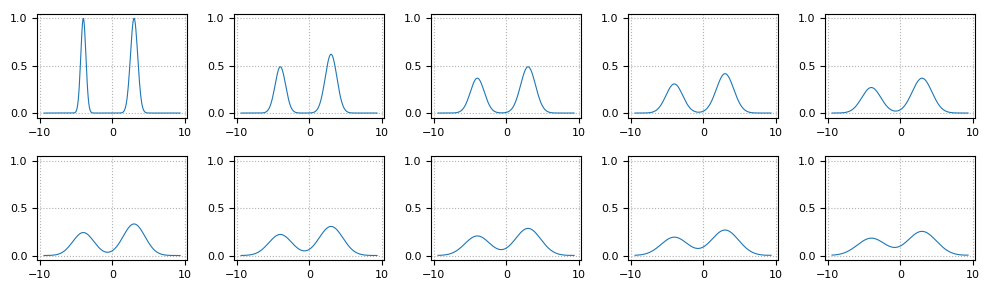

  0.937872 seconds (2.18 M allocations: 113.085 MiB, 4.17% gc time)


In [6]:
# Application - the solution of the heat equation u_t = u_{xx}
#
#     u(t) = exp(t (∂/∂x)^2) u(0)
#
sol_of_heat_eq(o::FFT_Data, u0, t) = o.FFT \ (exp.(t .* o.D2) .* (o.FFT * u0))

N = 2^8
K = 3
o = FFT_Data(K, N);

f0(x) = exp(-4(x+4)^2) + exp(-2(x-3)^2)
u0 = f0.(o.x)
t = roi(0,2,10)
@time u = [sol_of_heat_eq(o, u0, t) for t in t]

figure(figsize=(10, 3))
for j in 1:10
    subplot(2,5,j)
    plot_u(o.x, u[j])
    ylim(-0.05,1.05)
end
tight_layout()

## KdV方程式の数値解法の最適化

この節では次の形でのKdV方程式を $x$ 方向に関する周期境界条件のもとで数値的に解こう:

$$
u_t = -u_{xxx}-3(u^2)_x = -u_{xxx} -6uu_x.
$$

この方程式に従う時間発展は $\varDelta t$ が微小なとき次のように近似的に書き直される: $u(t) : x\mapsto u(t,x)$ について, 

$$
\begin{aligned}
u(t) &\mapsto
\tilde{u}(t) = 
\exp\left(-\varDelta t \left(\frac{\d}{\d x}\right)^3\right)u(t)
\\ &\mapsto
u(t+\varDelta t) = \tilde{u}(t) - 3\varDelta t\frac{\d}{\d x}(\tilde{u}(t)^2).
\end{aligned}
$$

以下では $x$ 方向について離散化し, $(\d/\d x)^3$ や $\d/\d x$ を高速Fourier変換(FFT)を使って実現する.

### プロット用函数

In [7]:
function plot_u(o, u, nrows, j, ymin, ymax)
    subplot(nrows, 5, j+1)
    plot_u(o.x, u)
    ylim(ymin, ymax)
    xticks(fontsize=8)
    yticks(fontsize=8)
    title("j = $j", fontsize=8)
end

function plot_KdV(o::FFT_Data, u, t; thin=10, ymin=-7.0, ymax=15.0)
    nplots = div(length(t), thin)
    nrows = div(nplots+4, 5)

    figure(figsize=(10, 1.75nrows))
    
    j = 0
    plot_u(o, @view(u[:,j+1]), nrows, j, ymin, ymax)

    for j in 1:nplots-1
        plot_u(o, @view(u[:,thin*j+1]), nrows, j, ymin, ymax)
    end
 
    tight_layout()
end

function anim_KdV(gifname, o::FFT_Data, u, t; thin=2, interval=100, ymin=-7.0, ymax=15.0)
    function plotframe(j)
        clf()
        plot(o.x, real(u[:, (j-1)*thin + 1]), lw=1.0)
        grid(ls=":")
        ylim(ymin, ymax)
        xticks(fontsize=8)
        yticks(fontsize=8)
        title("$(gifname):  j = $(j-1)", fontsize=10)
        plot()
    end
    fig = figure(figsize=(4, 3))
    n = (length(t)-1)÷thin + 1
    frames = [1;1;1;1;1;1;1;1;1; 1:n; n;n;n;n;n;n;n;n;n;]
    ani=animation[:FuncAnimation](fig, plotframe, frames=frames, interval=interval)
    ani[:save]("$(gifname).gif", writer="imagemagick")
    clf()
    displayfile("image/gif", "$(gifname).gif")
end

anim_KdV (generic function with 1 method)

### FFTを `FFT * v`, `FFT \ v` の形式で利用した場合

  8.667141 seconds (2.12 M allocations: 888.221 MiB, 1.89% gc time)


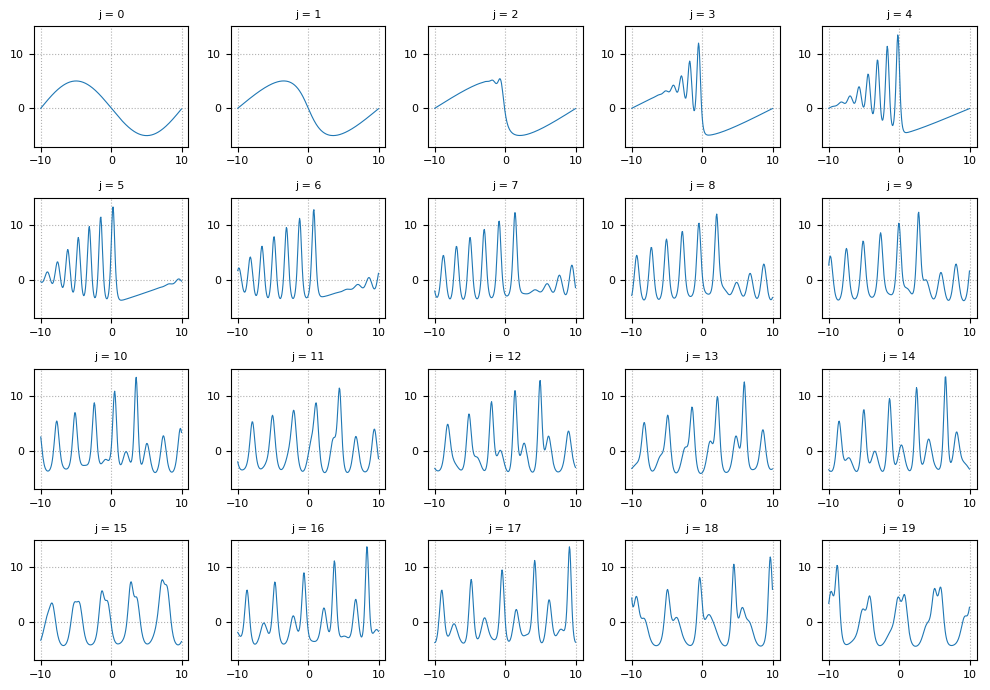

In [8]:
# FFT*v and FFT\v version

function update_KdV(o::FFT_Data, u, Δt, niters)
    v = o.FFT * u
    for iter in 1:niters
        v .= exp.(-Δt .* o.D3) .* v
        v .-= 3.0 .* Δt .* o.D .*(o.FFT * (o.FFT \ v).^2)
    end
    o.FFT \ v
end

function solve_KdV(o::FFT_Data{T}, f0, tmax) where T
    Δt = 1/o.N^2
    skip = floor(Int, 0.005/Δt)
    t = 0:skip*Δt:tmax
    M = length(t)
    u = Array{Complex{T},2}(undef, o.N, M)
    u[:,1] = Complex.(f0.(o.x))
    for j in 2:M
        u[:,j] = update_KdV(o, @view(u[:,j-1]), Δt, skip)
    end
    return real(u), t
end

N = 2^8
K = 20/(2π)
o = FFT_Data(K, N);

f0(x) = -5*sin(π*x/10)
Δt = 1/N^2
skip = 10*floor(Int, 0.005/Δt)

tmax = 1.0
@time u, t = solve_KdV(o, f0, tmax)

sleep(0.1)
plot_KdV(o, u, t)

### FFTを in-place で利用した場合

  7.794829 seconds (840.88 k allocations: 45.956 MiB, 0.20% gc time)


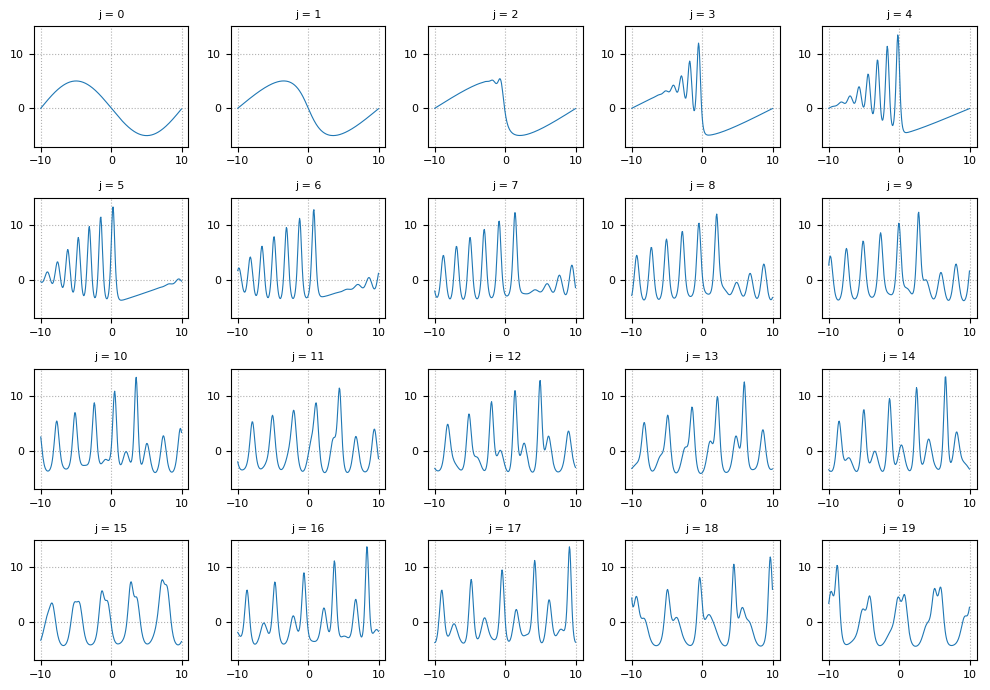

In [9]:
function update_KdV!(o::FFT_Data, u1, u0, Δt, niters)
    v = similar(u0)
    v_tmp = similar(u0)
    u_tmp = similar(u0)
    
    mul!(v, o.FFT, u0)
    for iter in 1:niters
        # v .= exp.(-Δt .* o.D3) .* v
        v .= exp.(-Δt .* o.D3) .* v
        
        # v .-= 3.0 .* Δt .* o.D .*(o.FFT * (o.FFT \ v).^2)
        ldiv!(u_tmp, o.FFT, v)
        u_tmp .*= u_tmp
        mul!(v_tmp, o.FFT, u_tmp)
        v .-= 3.0 .* Δt .* o.D .* v_tmp
    end
    ldiv!(u1, o.FFT, v)
end

function solve_KdV_inplace(o::FFT_Data{T}, f0, tmax) where T
    Δt = 1/o.N^2
    skip = floor(Int, 0.005/Δt)
    t = 0:skip*Δt:tmax
    M = length(t)
    u = Array{Complex{T},2}(undef, o.N, M)
    u[:,1] = Complex.(f0.(o.x))
    for j in 2:M
        update_KdV!(o, @view(u[:,j]), @view(u[:,j-1]), Δt, skip)
    end
    return real(u), t
end

N = 2^8
K = 20/(2π)
o = FFT_Data(K, N);

f0(x) = -5*sin(π*x/10)
Δt = 1/N^2
skip = 10*floor(Int, 0.005/Δt)

tmax = 1.0
@time u, t = solve_KdV_inplace(o, f0, tmax)

sleep(0.1)
plot_KdV(o, u, t)

### KdV方程式: 初期条件 sin

以下のアニメーションはKdV方程式

$$
u_t = -u_{xxx} - 3(u^2)_x = -u_{xxx} -6uu_x
$$

を初期条件

$$
u(0,x) = -5\sin(πx/10)
$$

のもとで数値的に解いた結果である.  $\sin$ の初期条件からたくさんのソリトンが放出されている.  この結果は


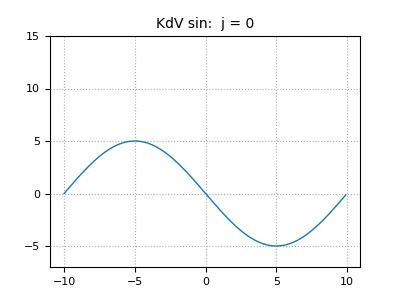

 26.332842 seconds (3.50 M allocations: 181.681 MiB, 0.24% gc time)


In [10]:
gifname = "KdV sin"
@time anim_KdV(gifname, o, u, t)

### ベンチマークテスト

In [11]:
using BenchmarkTools

N = 2^8
K = 20/(2π)
o = FFT_Data(K, N)

f0(x) = -5*sin(π*x/10)
Δt = 1/N^2
skip = 10*floor(Int, 0.005/Δt)

tmax = 1.4

1.4

In [12]:
@benchmark u, t = solve_KdV(o, f0, tmax)

BenchmarkTools.Trial: 
  memory estimate:  1.10 GiB
  allocs estimate:  642611
  --------------
  minimum time:     11.433 s (2.25% GC)
  median time:      11.433 s (2.25% GC)
  mean time:        11.433 s (2.25% GC)
  maximum time:     11.433 s (2.25% GC)
  --------------
  samples:          1
  evals/sample:     1

In [13]:
@benchmark u, t = solve_KdV_inplace(o, f0, tmax)

BenchmarkTools.Trial: 
  memory estimate:  20.48 MiB
  allocs estimate:  276931
  --------------
  minimum time:     10.609 s (0.00% GC)
  median time:      10.609 s (0.00% GC)
  mean time:        10.609 s (0.00% GC)
  maximum time:     10.609 s (0.00% GC)
  --------------
  samples:          1
  evals/sample:     1

以上のように in-place 版は非 in-place 版よりも計算時間が1割程度短く, in-place版の消費メモリは非 in-pace 版の50分の1である.

### KdV方程式: 2-soliton解

  7.884885 seconds (384.44 k allocations: 24.193 MiB, 0.81% gc time)


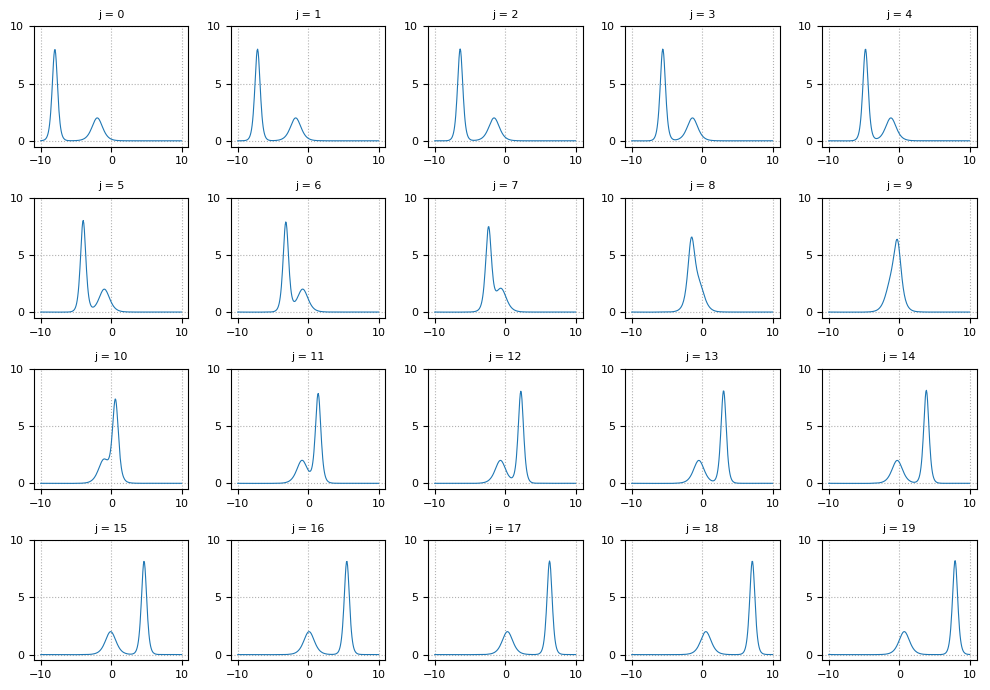

In [14]:
N = 2^8
K = 20/(2π)
o = FFT_Data(K, N);

KdVsoliton(c, a, x) = c/2*(sech(sqrt(c)/2*(x-a)))^2
f0(x) = KdVsoliton(16.0, -8.0, x) + KdVsoliton(4.0, -2.0, x)
Δt = 1/N^2
skip = 10*floor(Int, 0.005/Δt)

tmax = 1.0
@time u, t = solve_KdV_inplace(o, f0, tmax)

sleep(0.1)
plot_KdV(o, u, t, ymin=-0.5, ymax=10.0)


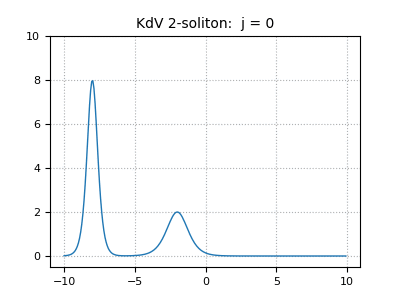

 26.929848 seconds (89.47 k allocations: 9.704 MiB)


In [15]:
gifname = "KdV 2-soliton"
@time anim_KdV(gifname, o, u, t, ymin=-0.5, ymax=10.0)

## 1次元のSchroedinger方程式

In [16]:
# V はポテンシャル函数
#
mutable struct Schroedinger_Data{T, S, R}
    o::FFT_Data{T,S}
    V::R
    v::Array{T,1}
end

# FFT_Data o とポテンシャル函数 V から Schroedinger_Data を作成する函数
#
Schroedinger_Data(o, V) = Schroedinger_Data(o, V, V.(o.x))

function update_Schroedinger!(s::Schroedinger_Data, u1, u0, Δt, skip)
    o = s.o
    U_tmp = similar(u0)
    u1 .= u0

    for iter in 1:skip
        # exp.(-im .* Δt .* s.v) .* (o.FFT\(exp.(0.5im .* Δt .* o.D2).*(o.FFT * u)))
        mul!(U_tmp, o.FFT, u1)
        U_tmp .*= exp.(0.5im .* Δt .* o.D2)
        ldiv!(u1, o.FFT, U_tmp)
        u1 .*= exp.(-im .* Δt .* s.v)
    end
end

function solve_Schroedinger(s::Schroedinger_Data{T,S,R}, u0, tmax; Δt=2π/1000, skip=10) where {T,S,R}
    o = s.o
    t = 0:skip*Δt:tmax+10eps()
    M = length(t)
    u = Array{Complex{T},2}(undef, o.N, M)
    u[:,1] = u0
    for j in 2:M
        update_Schroedinger!(s, @view(u[:,j]), @view(u[:,j-1]), Δt, skip)
    end
    return u, t
end

function plot_complexvalued(x, u, ymin, ymax)
    plot(o.x, real(u), lw=0.8)
    plot(o.x, imag(u), lw=0.8, ls="--")
    ylim(ymin, ymax)
    grid(ls=":")
    xticks(fontsize=8)
    yticks(fontsize=8)
end

function plot_Schroedinger(s::Schroedinger_Data, u, t; thin=10, ymin=-1.1, ymax=1.1)
    nplots = (length(t)-1)÷thin + 1
    o = s.o
    nrows = div(nplots+3, 5)

    figure(figsize=(4, 1.75))
    subplot(121)
    plot_complexvalued(o.x, u[:,1], ymin, ymax)
    title("initial state", fontsize=9)
    subplot(122)
    plot_u(o.x, s.v)
    title("potential", fontsize=9)
    tight_layout()

    
    figure(figsize=(10, 1.75nrows))
    for j in 1:nplots-1
        subplot(nrows, 5, j)
        plot_complexvalued(o.x, u[:,(j-1)*thin+2], ymin, ymax)
        title("j = $j", fontsize=9)
    end
    tight_layout()
end

function anim_Schroedinger(gifname, s::Schroedinger_Data, u, t; thin=2, interval=100, ymin=-1.1, ymax=1.1, giftitle=gifname)
    o = s.o
    function plotframe(j)
        clf()
        plot(o.x, real(u[:, (j-1)*thin+1]), lw=1.0)
        plot(o.x, imag(u[:, (j-1)*thin+1]), lw=1.0, ls="--")
        grid(ls=":")
        ylim(ymin, ymax)
        xticks(fontsize=8)
        yticks(fontsize=8)
        title("$(giftitle):  j = $(j-1)", fontsize=10)
        plot()
    end
    fig = figure(figsize=(4, 3))
    n = (length(t)-1)÷thin + 1
    frames = [1;1;1;1;1;1;1;1;1; 1:n; n;n;n;n;n;n;n;n;n;]
    ani=animation[:FuncAnimation](fig, plotframe, frames=frames, interval=interval)
    ani[:save]("$(gifname).gif", writer="imagemagick")
    clf()
    displayfile("image/gif", "$(gifname).gif")
end

anim_Schroedinger (generic function with 1 method)

### Gaussian packet

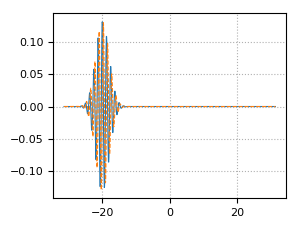

In [17]:
mutable struct GaussianPacket{T<:Real}
    x₀::T
    p₀::T
    σ::T
    Δx::T
end

function GaussianPacket(x₀, p₀, σ, o::FFT_Data)
    Δx = o.x[2] - o.x[1]
    GaussianPacket(x₀, p₀, σ, Δx)
end

function (f::GaussianPacket)(x)
    sqrt(f.Δx)/(π^(1/4)*sqrt(f.σ)) *
    exp(im*f.p₀*(x-f.x₀/2) - (x-f.x₀)^2/(2f.σ^2))
end

N = 2^10
K = 10
o = FFT_Data(K, N);

g0 = GaussianPacket(-20.0, 5.0, 2.0, o)
plot_u(o.x, g0.(o.x));

### 自由粒子

typeof(o) = FFT_Data{Float64,FFTW.cFFTWPlan{Complex{Float64},-1,false,1}}
  0.809061 seconds (1.43 M allocations: 75.963 MiB, 3.53% gc time)


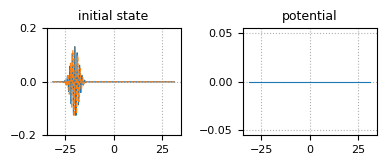

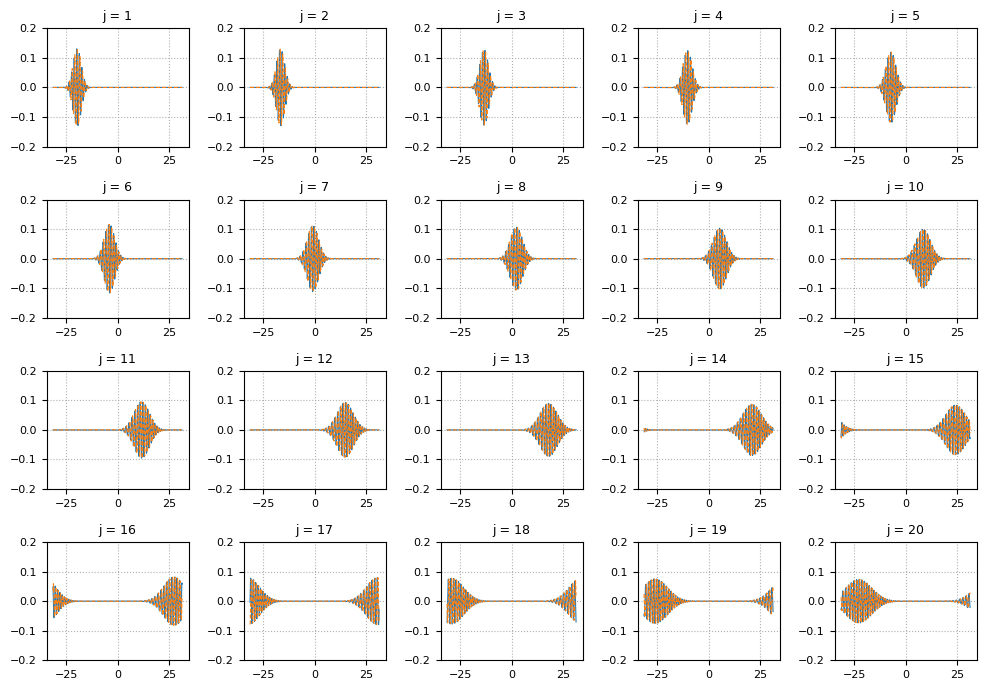

In [18]:
# 自由粒子

N = 2^10
K = 10
o = FFT_Data(K, N);
@show typeof(o)

V(x) = 0.0
s = Schroedinger_Data(o, V)

g0 = GaussianPacket(-20.0, 5.0, 2.0, o)
u0 = g0.(o.x)

T = 2.0
tmax = 2π*T
@time u, t = solve_Schroedinger(s, u0, tmax)

sleep(0.1)
plot_Schroedinger(s, u, t, ymin=-0.2, ymax=0.2)


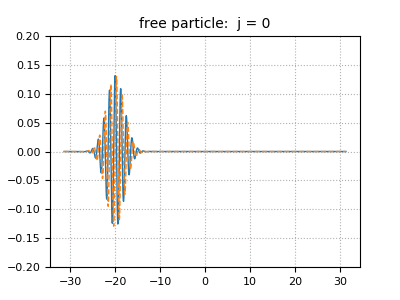

 28.971086 seconds (405.89 k allocations: 36.768 MiB, 0.05% gc time)


In [19]:
gifname = "free particle"
@time anim_Schroedinger(gifname, s, u, t, ymin=-0.2, ymax=0.2)

### 低い壁

typeof(o) = FFT_Data{Float64,FFTW.cFFTWPlan{Complex{Float64},-1,false,1}}
  0.261462 seconds (5.03 k allocations: 5.007 MiB)


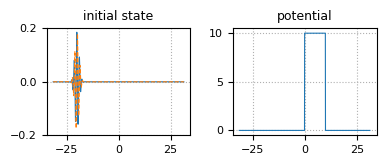

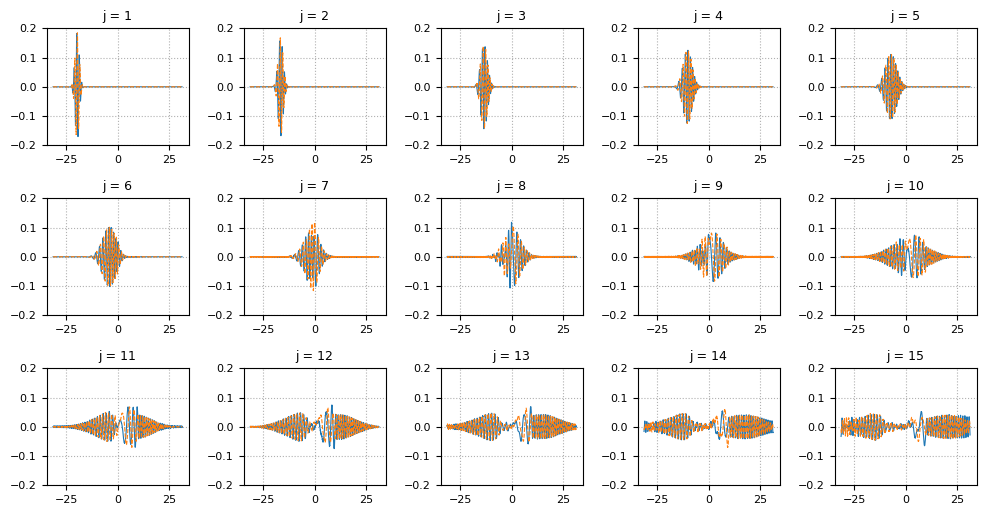

In [20]:
# 壁=(高さ10、幅10)、粒子=運動量5)

N = 2^10
K = 10
o = FFT_Data(K, N);
@show typeof(o)

V(x) = ifelse(0 ≤ x ≤ 10, 10.0, 0.0)
s = Schroedinger_Data(o, V)

g0 = GaussianPacket(-20.0, 5.0, 1.0, o)
u0 = g0.(o.x)

T = 1.5
tmax = 2π*T
@time u, t = solve_Schroedinger(s, u0, tmax)

sleep(0.1)
plot_Schroedinger(s, u, t, ymin=-0.2, ymax=0.2)


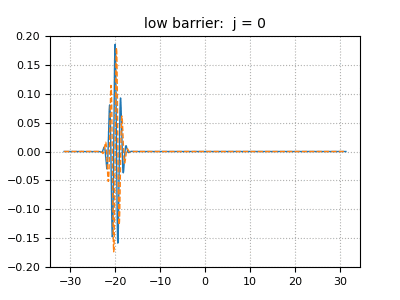

 22.670839 seconds (80.45 k allocations: 18.642 MiB, 0.03% gc time)


In [21]:
gifname = "low barrier"
@time anim_Schroedinger(gifname, s, u, t, ymin=-0.2, ymax=0.2)

### 高い壁

typeof(o) = FFT_Data{Float64,FFTW.cFFTWPlan{Complex{Float64},-1,false,1}}
  0.298520 seconds (5.03 k allocations: 5.007 MiB, 2.52% gc time)


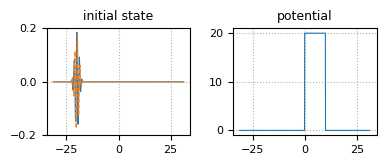

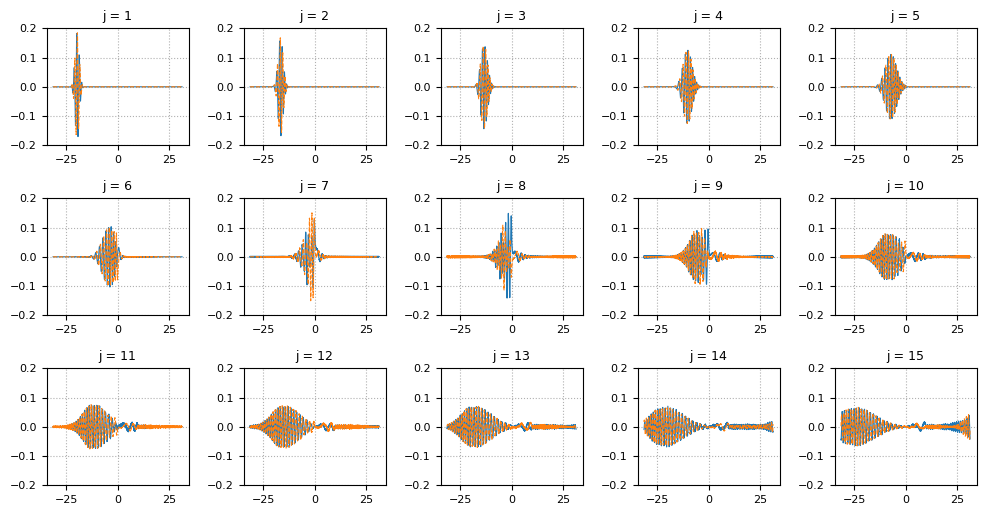

In [22]:
# 壁=(高さ20、幅10)、粒子=運動量5)

N = 2^10
K = 10
o = FFT_Data(K, N);
@show typeof(o)

V(x) = ifelse(0 ≤ x ≤ 10, 20.0, 0.0)
s = Schroedinger_Data(o, V)

g0 = GaussianPacket(-20.0, 5.0, 1.0, o)
u0 = g0.(o.x)

T = 1.5
tmax = 2π*T
@time u, t = solve_Schroedinger(s, u0, tmax)

sleep(0.1)
plot_Schroedinger(s, u, t, ymin=-0.2, ymax=0.2)


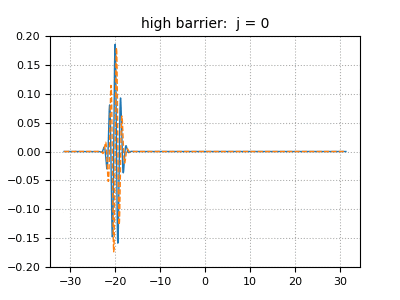

 23.436036 seconds (80.00 k allocations: 14.509 MiB, 0.03% gc time)


In [23]:
gifname = "high barrier"
@time anim_Schroedinger(gifname, s, u, t, ymin=-0.2, ymax=0.2)

### 調和振動子

typeof(o) = FFT_Data{Float64,FFTW.cFFTWPlan{Complex{Float64},-1,false,1}}
  0.415711 seconds (6.68 k allocations: 6.664 MiB)


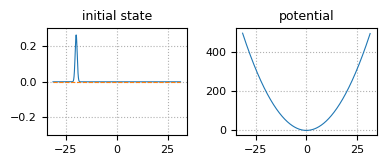

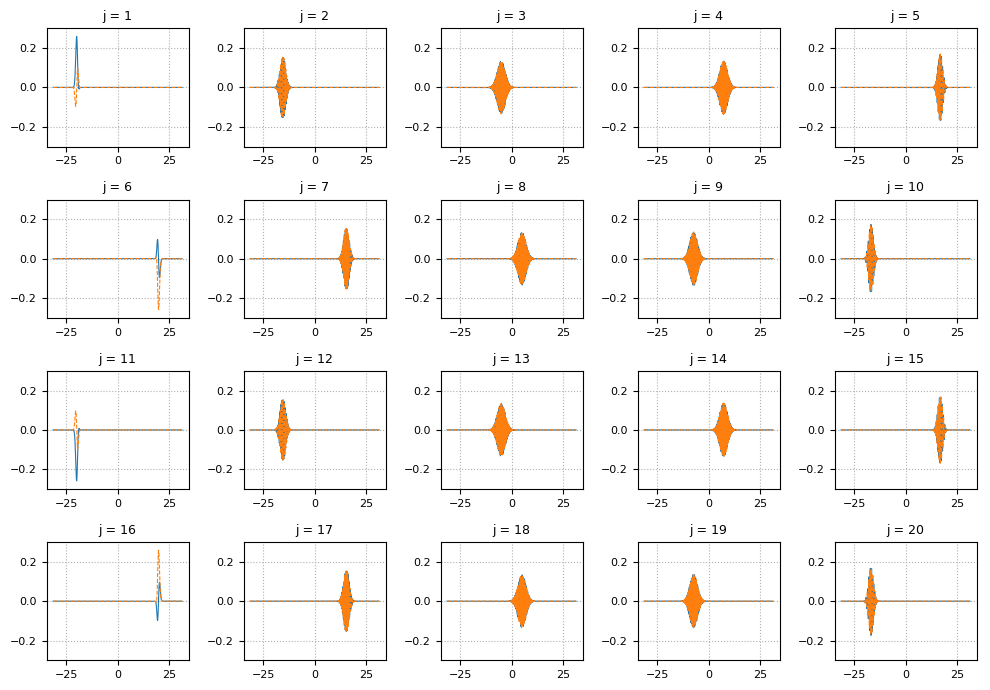

In [24]:
# 調和振動子 (周期 2π)

N = 2^10
K = 10
o = FFT_Data(K, N);
@show typeof(o)

V(x) = x^2/2
s = Schroedinger_Data(o, V)

g0 = GaussianPacket(-20.0, 0.0, 0.5, o)
u0 = g0.(o.x)

T = 2.0
tmax = 2π*T
@time u, t = solve_Schroedinger(s, u0, tmax)

sleep(0.1)
plot_Schroedinger(s, u, t, ymin=-0.3, ymax=0.3)


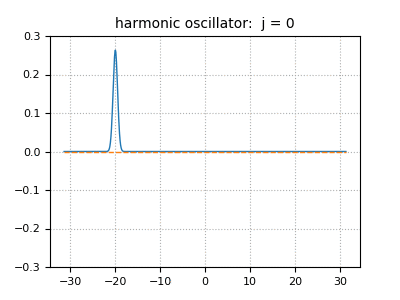

 52.132494 seconds (191.10 k allocations: 30.885 MiB, 0.06% gc time)


In [25]:
gifname = "harmonic oscillator"
@time anim_Schroedinger(gifname, s, u, t, ymin=-0.3, ymax=0.3, thin=1)

### $V(x) = -100 \exp(-x^2/100)$

typeof(o) = FFT_Data{Float64,FFTW.cFFTWPlan{Complex{Float64},-1,false,1}}
  0.955456 seconds (115.11 k allocations: 12.158 MiB, 6.97% gc time)


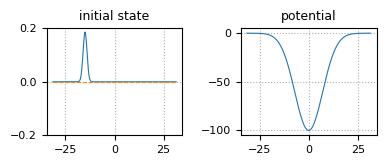

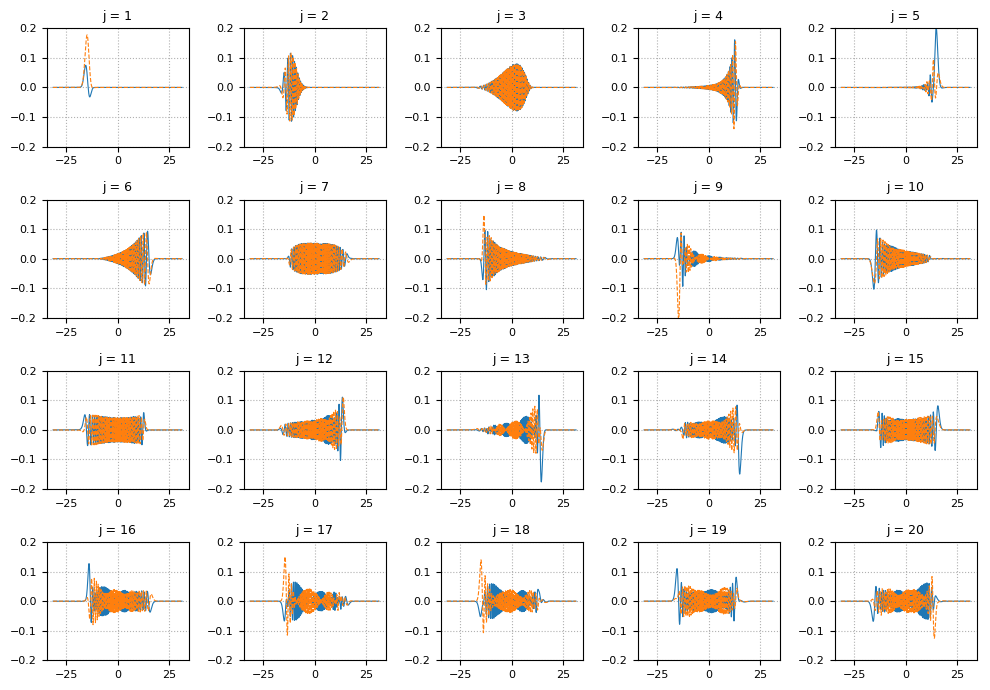

In [26]:
# V(x) = -20 exp(-x^2/25)

N = 2^10
K = 10
o = FFT_Data(K, N);
@show typeof(o)

V(x) = -100 * exp(-x^2/100)
s = Schroedinger_Data(o, V)

g0 = GaussianPacket(-15.0, 0.0, 1.0, o)
u0 = g0.(o.x)

T = 4.0
tmax = 2π*T
@time u, t = solve_Schroedinger(s, u0, tmax, skip=20)

sleep(0.1)
plot_Schroedinger(s, u, t, ymin=-0.2, ymax=0.2)


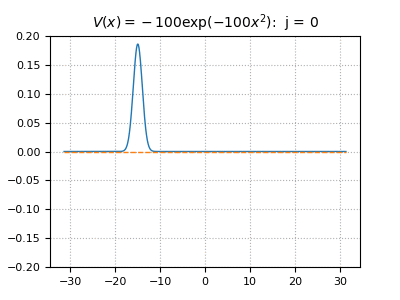

 30.274456 seconds (115.35 k allocations: 22.111 MiB, 0.02% gc time)


In [27]:
gifname = "V(x)=-100exp(-x2／100)"
giftitle = "\$V(x)=-100\\exp(-100x^2)\$"
@time anim_Schroedinger(gifname, s, u, t, ymin=-0.2, ymax=0.2, giftitle=giftitle)

## Smith方程式

KdV equation:
$$
u_t = -\partial_x^3 u - 3\partial_x(u^2).
$$

Smith's equation:
$$
u_t = 2a^{-2}\left( \sqrt{1-a^2\partial_x^2} - 1 \right)\partial_x u - 3\partial_x(u^2).
$$

以下では $a^2=0.15$ と仮定する.

In [28]:
function plot_Smith(o::FFT_Data, u, t; thin=10, ymin=-7.0, ymax=25.0)
    nplots = div(length(t), thin)
    nrows = div(nplots+4, 5)

    figure(figsize=(10, 1.75nrows))
    
    j = 0
    plot_u(o, @view(u[:,j+1]), nrows, j, ymin, ymax)

    for j in 1:nplots-1
        plot_u(o, @view(u[:,thin*j+1]), nrows, j, ymin, ymax)
    end
 
    tight_layout()
end

function anim_Smith(gifname, o::FFT_Data, u, t; thin=2, interval=100, ymin=-7.0, ymax=25.0)
    function plotframe(j)
        clf()
        plot(o.x, real(u[:, (j-1)*thin + 1]), lw=1.0)
        grid(ls=":")
        ylim(ymin, ymax)
        xticks(fontsize=8)
        yticks(fontsize=8)
        title("$(gifname):  j = $(j-1)", fontsize=10)
        plot()
    end
    fig = figure(figsize=(4, 3))
    n = (length(t)-1)÷thin + 1
    frames = [1;1;1;1;1;1;1;1;1; 1:n; n;n;n;n;n;n;n;n;n;]
    ani=animation[:FuncAnimation](fig, plotframe, frames=frames, interval=interval)
    ani[:save]("$(gifname).gif", writer="imagemagick")
    clf()
    displayfile("image/gif", "$(gifname).gif")
end

anim_Smith (generic function with 1 method)

In [29]:
function update_Smith!(o::FFT_Data, u1, u0, Δt, niters, a²)
    v = similar(u0)
    v_tmp = similar(u0)
    u_tmp = similar(u0)
    
    mul!(v, o.FFT, u0)
    for iter in 1:niters
        v .= exp.(2 ./ a² .* Δt .* (sqrt.(1 .- a² .* o.D2) .- 1).*o.D) .* v
        
        # v .-= 3.0 .* Δt .* o.D .*(o.FFT * (o.FFT \ v).^2)
        ldiv!(u_tmp, o.FFT, v)
        u_tmp .*= u_tmp
        mul!(v_tmp, o.FFT, u_tmp)
        v .-= 3.0 .* Δt .* o.D .* v_tmp
    end
    ldiv!(u1, o.FFT, v)
end

function solve_Smith_inplace(o::FFT_Data{T}, f0, tmax; a²=0.15) where T
    Δt = 1/o.N^2
    skip = floor(Int, 0.005/Δt)
    t = 0:skip*Δt:tmax
    M = length(t)
    u = Array{Complex{T},2}(undef, o.N, M)
    u[:,1] = Complex.(f0.(o.x))
    for j in 2:M
        update_Smith!(o, @view(u[:,j]), @view(u[:,j-1]), Δt, skip, a²)
    end
    return real(u), t
end

solve_Smith_inplace (generic function with 1 method)

### Smith方程式: 初期条件 sin

 40.363118 seconds (2.11 M allocations: 115.233 MiB, 0.12% gc time)


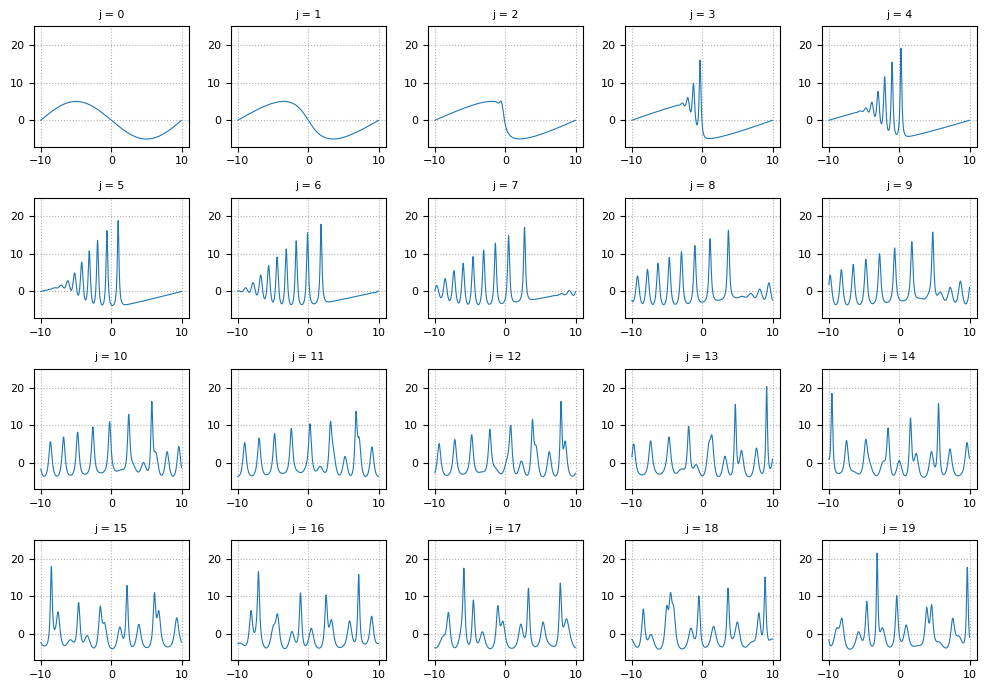

In [30]:
N = 2^9
K = 20/(2π)
o = FFT_Data(K, N);

f0(x) = -5*sin(π*x/10)
Δt = 1/N^2
skip = 10*floor(Int, 0.005/Δt)

tmax = 1.0
@time u, t = solve_Smith_inplace(o, f0, tmax)

sleep(0.1)
plot_Smith(o, u, t, thin=10)


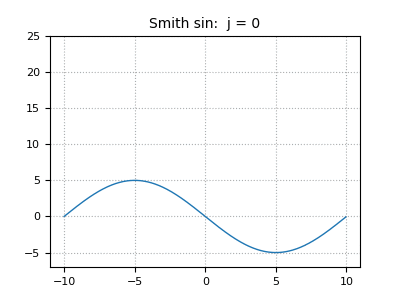

 27.640708 seconds (360.26 k allocations: 24.151 MiB, 0.03% gc time)


In [31]:
gifname = "Smith sin"
@time anim_Smith(gifname, o, u, t)

### Smith方程式: 初期条件 KdV 2-soliton

 38.722846 seconds (912.37 k allocations: 57.235 MiB, 0.04% gc time)


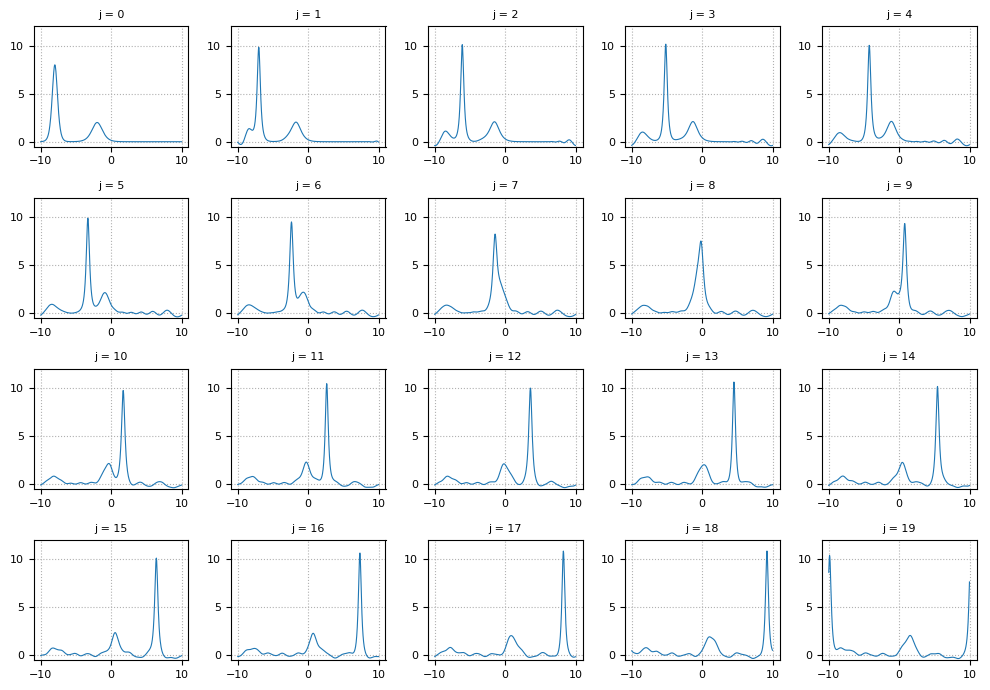

In [32]:
N = 2^9
K = 20/(2π)
o = FFT_Data(K, N);

KdVsoliton(c, a, x) = c/2*(sech(sqrt(c)/2*(x-a)))^2
f0(x) = KdVsoliton(16.0, -8.0, x) + KdVsoliton(4.0, -2.0, x)
Δt = 1/N^2
skip = 10*floor(Int, 0.005/Δt)

tmax = 1.0
@time u, t = solve_Smith_inplace(o, f0, tmax)

sleep(0.1)
plot_Smith(o, u, t, ymin=-0.5, ymax=12.0)


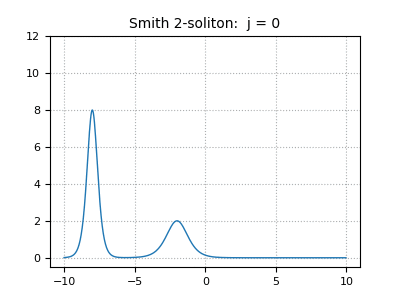

 26.687429 seconds (88.84 k allocations: 10.016 MiB)


In [33]:
gifname = "Smith 2-soliton"
@time anim_Smith(gifname, o, u, t, ymin=-0.5, ymax=12.0)